In [1]:
import pandas as pd
import data_preprocessing as dp

In [247]:
df1 = pd.read_csv('../results/predictions/all_mixed_predictions.csv')
df2 = pd.read_csv('../results/predictions/all_base_predictions.csv')

df = pd.concat([df1, df2[df2.columns[8:]]], axis=1)

# Get label maps
label_map, inverse_label_map = dp.get_data_label_map(df)

In [240]:
import torch

def denormalize(tensor, mean, std):
    """
    Denormalize a tensor given the mean and standard deviation used for normalization.
    
    Args:
    - tensor (torch.Tensor): Input tensor to denormalize
    - mean (tuple): Mean values used for normalization
    - std (tuple): Standard deviation values used for normalization
    
    Returns:
    - torch.Tensor: Denormalized tensor
    """
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return tensor * std + mean

# No distortion

In [248]:
from eval import overall_accuracy, avg_individual_accuracy

noaug_results = pd.DataFrame(columns=['split', 'model', 'aug', 'overall_accuracy', 'avg_individual_accuracy'])

for pred_column in [col for col in df.columns if 'none' in col]:
    model = pred_column.split('_')[0] # + '_' + pred_column.split('_')[1]
    split = pred_column.split('_')[2]
    aug = pred_column.split('_')[1]

    acc = overall_accuracy(df, split, pred_column)
    avg_acc = avg_individual_accuracy(df, split, pred_column)

    new_row = pd.DataFrame({'split': [split], 'model': [model], 'aug': [aug], 'overall_accuracy': [acc], 'avg_individual_accuracy': [avg_acc]})
    noaug_results = pd.concat([noaug_results, new_row])

In [249]:
import altair as alt

df_melted = noaug_results.melt(id_vars=['split', 'model'], value_vars=['overall_accuracy', 'avg_individual_accuracy'], var_name='metric', value_name='accuracy')

# Define the order of splits
split_order = ['train', 'val', 'test']  # Adjust this list as needed

# Create the chart with larger text
chart = alt.Chart(noaug_results).mark_bar().encode(
    x=alt.X('model:N', 
            title='Model', 
            sort=['arcface_mixed', 'arcface_base', 'crossentropy_mixed', 'crossentropy_base'],
            axis=alt.Axis(labelAngle=-45, labelFontSize=18, titleFontSize=24)),
    y=alt.Y('overall_accuracy:Q', 
            title='Accuracy',
            axis=alt.Axis(labelFontSize=18, titleFontSize=24)),
    color=alt.Color('aug:N', 
                    title=['Training', 'Augmentation'],
                    legend=alt.Legend(labelFontSize=18, titleFontSize=24)),
    column=alt.Column('split:N', 
                      title='Split', 
                      sort=split_order,
                      header=alt.Header(labelFontSize=18, titleFontSize=24)),
    xOffset='aug'
).properties(
    width=300,
    height=300,
    title=alt.TitleParams(text='Model Performance w/o Distortions', fontSize=30, anchor='middle', offset=20)
).configure_axis(
    labelFontSize=18,
    titleFontSize=24
).configure_legend(
    labelFontSize=18,
    titleFontSize=24
)

chart

alt.Chart(...)

## Time-aware vs Time-proportional

In [250]:
# First, let's get all the prediction columns
pred_cols = ['arcface_base_time-proportional_none']

# Create a new dataframe to store the results
result = pd.DataFrame()

# Copy the individual and split columns
result = df[['identity', 'time-proportional'] + pred_cols].copy()

for column in pred_cols:
    # In result, set true if the identity is the same as the prediction
    result[column] = df['identity'] == df[column]

# Calculate the per individual accuracy for each column, keeping only rows where the split is 'test'
per_individual_accuracy = result[result['time-proportional'] == 'test'].groupby('identity')[pred_cols].mean().reset_index()

# Find the number of images in training set for each individual
num_train_images = df[df['time-proportional'] == 'train'].groupby('identity')['time-proportional'].count().reset_index()
num_train_images.columns = ['identity', 'num_train_images']

# Find number of images in test set for each individual
num_test_images = df[df['time-proportional'] == 'test'].groupby('identity')['time-proportional'].count().reset_index()
num_test_images.columns = ['identity', 'num_test_images']

# Merge the per individual accuracy with the number of images
per_individual_accuracy = pd.merge(per_individual_accuracy, num_train_images, on='identity')
per_individual_accuracy = pd.merge(per_individual_accuracy, num_test_images, on='identity')

per_individual_accuracy['test_train_ratio'] = per_individual_accuracy['num_test_images'] / per_individual_accuracy['num_train_images']

# Plot a histogram of the individual accuracies
import altair as alt

alt.Chart(per_individual_accuracy).mark_point().encode(
    x=alt.X('num_train_images:Q', title='Number of Training Images', axis=alt.Axis(labelFontSize=18, titleFontSize=24)),
    y=alt.Y('arcface_base_time-proportional_none:Q', title='Accuracy', axis=alt.Axis(labelFontSize=18, titleFontSize=24)),
    size=alt.Size('num_test_images', title=['Number of', 'Testing Images'], legend=alt.Legend(labelFontSize=18, titleFontSize=24)),
).properties(
    width=300,
    height=300,
    title=alt.TitleParams(text=['Time-proportional', 'per-individual accuracy'], fontSize=30, anchor='middle', offset=20)
)

alt.Chart(...)

In [251]:
# First, let's get all the prediction columns
pred_cols = ['arcface_base_time-aware_none']

# Create a new dataframe to store the results
result = pd.DataFrame()

# Copy the individual and split columns
result = df[['identity', 'time-aware'] + pred_cols].copy()

for column in pred_cols:
    # In result, set true if the identity is the same as the prediction
    result[column] = df['identity'] == df[column]

# Calculate the per individual accuracy for each column, keeping only rows where the split is 'test'
per_individual_accuracy = result[result['time-aware'] == 'test'].groupby('identity')[pred_cols].mean().reset_index()

# Find the number of images in training set for each individual
num_train_images = df[df['time-aware'] == 'train'].groupby('identity')['time-aware'].count().reset_index()
num_train_images.columns = ['identity', 'num_train_images']

# Find number of images in test set for each individual
num_test_images = df[df['time-aware'] == 'test'].groupby('identity')['time-aware'].count().reset_index()
num_test_images.columns = ['identity', 'num_test_images']

# Merge the per individual accuracy with the number of images
per_individual_accuracy = pd.merge(per_individual_accuracy, num_train_images, on='identity')
per_individual_accuracy = pd.merge(per_individual_accuracy, num_test_images, on='identity')

per_individual_accuracy['test_train_ratio'] = per_individual_accuracy['num_test_images'] / per_individual_accuracy['num_train_images']

# Plot a histogram of the individual accuracies
import altair as alt

alt.Chart(per_individual_accuracy).mark_point().encode(
    x=alt.X('num_train_images:Q', title='Number of Training Images', axis=alt.Axis(labelFontSize=18, titleFontSize=24)),
    y=alt.Y('arcface_base_time-aware_none:Q', title='Accuracy', axis=alt.Axis(labelFontSize=18, titleFontSize=24)),
    size=alt.Size('num_test_images', title=['Number of', 'Testing Images'], legend=alt.Legend(labelFontSize=18, titleFontSize=24)),
).properties(
    width=300,
    height=300,
    title=alt.TitleParams(text=['Time-aware', 'per-individual accuracy'], fontSize=30, anchor='middle', offset=20)
)

alt.Chart(...)

# Low Resolution

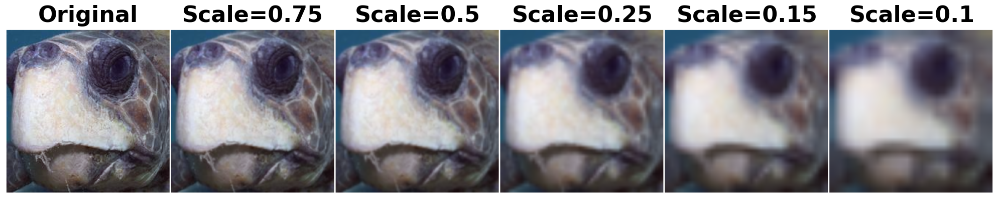

In [252]:
import torch
import torchvision.transforms as T
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

from models import load_model_and_data

def resolution_distortion(images, scale_factor=0.5):
    """
    Lowers the resolution of the images and then scales them back to 224x224.
    
    Args:
    images (torch.Tensor): Input images of shape (B, C, H, W)
    scale_factor (float): Factor to scale down the image resolution
    
    Returns:
    torch.Tensor: Distorted images of shape (B, C, 224, 224)
    """
    B, C, H, W = images.shape
    
    # Calculate new dimensions
    new_H, new_W = int(H * scale_factor), int(W * scale_factor)
    
    # Define the transformation pipeline
    transform = T.Compose([
        T.Resize((new_H, new_W), antialias=True),  # Lower resolution
        T.Resize((224, 224), antialias=True)  # Scale back to 224x224
    ])
    
    # Apply the transformation
    distorted_images = torch.stack([transform(img) for img in images])
    
    return distorted_images

result = load_model_and_data('arcface_base_time-aware.pth', 'arcface', 'time-aware', label_map)

model = result['model']
test_loader = result['test_loader']
clean_train_loader = result['clean_train_loader']

# Get the first batch from the test loader
dataiter = iter(test_loader)
images, _ = next(dataiter)

# Select the first image from the batch
image = images[4].unsqueeze(0)  # Add batch dimension [1, C, H, W]

scale_factors = [1, 0.75, 0.5, 0.25, 0.15, 0.1]
distorted_images = []

for scale in scale_factors:
    distorted = resolution_distortion(image, scale_factor=scale)
    distorted_images.append(distorted.squeeze(0))

# Create a grid of images
grid = make_grid(torch.stack(distorted_images), nrow=len(scale_factors), normalize=True, pad_value=1)

# Plot the grid
plt.figure(figsize=(20, 5))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')

# Add labels
for i, scale in enumerate(scale_factors):
    plt.text(i * grid.shape[2] / len(scale_factors) + grid.shape[2] / (2 * len(scale_factors)), -10,
             f'Scale={scale}' if scale != 1 else 'Original', horizontalalignment='center', fontsize=32, fontweight='bold', color='black')

plt.tight_layout()
plt.show()

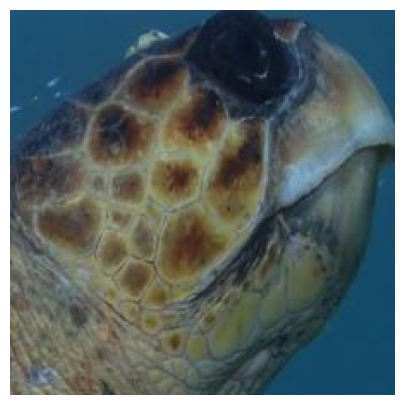

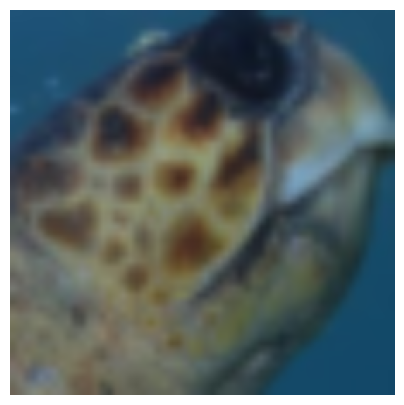

In [253]:
# Get an image and plot it clean and low res
# Get the first batch from the test loader
dataiter = iter(test_loader)
images, _ = next(dataiter)
# Select the first image from the batch
image = images[43].unsqueeze(0)  # Add batch dimension [1, C, H, W]

# Denormalization parameters
mean = (0.3717, 0.4016, 0.3666)
std = (0.1553, 0.1433, 0.1397)

# Denormalize the image
image = denormalize(image, mean, std)

# Define the transformation pipeline
transform = T.Compose([
    T.Resize((56, 56), antialias=True),  # Lower resolution
    T.Resize((224, 224), antialias=True)  # Scale back to 224x224
])

# Apply the transformation
blurred = transform(image)

# Plot the original and blurred images on two separate plots
plt.figure(figsize=(5, 5))
plt.imshow(image[0].permute(1, 2, 0))
plt.axis('off')
plt.show()

plt.figure(figsize=(5, 5))
plt.imshow(blurred[0].permute(1, 2, 0))
plt.axis('off')
plt.show()

In [302]:
lr_results = pd.DataFrame(columns=['split', 'model', 'aug', 'mdaug', 'scale_factor', 'overall_accuracy', 'avg_individual_accuracy'])

for pred_column in [col for col in df.columns if 'lr' in col]:
    model = pred_column.split('_')[0]
    mdaug = pred_column.split('_')[0] + ' - ' + pred_column.split('_')[1]
    aug = pred_column.split('_')[1]
    split = pred_column.split('_')[2]
    sf = pred_column.split('sf=')[1].split(')')[0]

    acc = overall_accuracy(df, split, pred_column)
    avg_acc = avg_individual_accuracy(df, split, pred_column)

    new_row = pd.DataFrame({'split': [split], 'model': [model], 'aug': [aug], 'mdaug': [mdaug], 'scale_factor': [sf], 'overall_accuracy': [acc], 'avg_individual_accuracy': [avg_acc]})
    lr_results = pd.concat([lr_results, new_row])

In [318]:
df_melted = lr_results

chart = alt.Chart(df_melted).mark_line().encode(
    x=alt.X('scale_factor:Q', 
            sort='descending', 
            title='Scale Factor',
    ),
    y=alt.Y('overall_accuracy:Q', title='Accuracy'),
    color=alt.Color('model:N', title='Loss Function'),
    column=alt.Column('split:N', 
                      title='Split', 
                      sort=['time-aware', 'time-proportional', 'random']),
    strokeDash=alt.StrokeDash('aug:N',
        scale=alt.Scale(
            domain=['base', 'distorted'],
            range=[[0], [4, 2]]
        ),
        title=['Training', 'Augmentation']
    )
).properties(
    width=300,
    height=300,
    title=alt.TitleParams(text='Model Performance with Resolution Decrese', fontSize=30, anchor='middle', offset=20)
).configure_axis(
    labelFontSize=18,
    titleFontSize=24
).configure_header(
    labelFontSize=18,
    titleFontSize=24
).configure_legend(
    labelFontSize=18,
    titleFontSize=24
)

chart

alt.Chart(...)

In [319]:
df_melted = lr_results.melt(id_vars=['split', 'model', 'aug', 'mdaug', 'scale_factor'], value_vars=['overall_accuracy', 'avg_individual_accuracy'], var_name='metric', value_name='accuracy')

chart = alt.Chart(df_melted).mark_line().encode(
    x=alt.X('scale_factor:Q', 
            sort='descending', 
            title='Scale Factor',
    ),
    y=alt.Y('accuracy:Q', title='Accuracy'),
    color=alt.Color('mdaug:N', title='Model - Aug'),
    column=alt.Column('split:N', 
                      title='Split', 
                      sort=['time-aware', 'time-proportional', 'random']),
    strokeDash=alt.StrokeDash('metric:N',
        scale=alt.Scale(
            domain=['overall_accuracy', 'avg_individual_accuracy'],
            range=[[0], [4, 2]]
        ),
        title=['Accuracy', 'Metric']
    ),
).properties(
    width=300,
    height=300,
    title=alt.TitleParams(text='Model Performance with Resolution Decrease', fontSize=30, anchor='middle', offset=20)
).configure_axis(
    labelFontSize=18,
    titleFontSize=24
).configure_header(
    labelFontSize=18,
    titleFontSize=24
).configure_legend(
    labelFontSize=18,
    titleFontSize=24,
    labelLimit=0
)

chart

alt.Chart(...)

In [256]:
import numpy as np

# First, let's get all the prediction columns
pred_cols = [col for col in df.columns if 'lr' in col and 'base' in col]

# Create a new dataframe to store the results
result = pd.DataFrame()

# Copy the individual and split columns
result['identity'] = df['identity']
result['time-aware'] = df['time-aware']
result['time-proportional'] = df['time-proportional']
result['random'] = df['random']

# Function to find the sigma at which prediction becomes incorrect
def find_breaking_ks(row, base_col):
    scale_factors = [0.1, 0.15, 0.25, 0.5, 0.75]
    correct = 0
    for sf in scale_factors:
        col = f"{base_col}_lr(sf={sf})"
        if row[col] == row['identity']:
            correct += 1
    return correct / len(scale_factors)

# Process each model and split combination
models = ['crossentropy', 'arcface']
splits = ['time-aware', 'time-proportional', 'random']

for model in models:
    for split in splits:
        base_col = f"{model}_base_{split}"
        result[f"{model}_{split}_breaking_sf"] = df.apply(lambda x: find_breaking_ks(x, base_col) if x[f"{split}"] == 'test' else np.nan, axis=1)

indiv_result = result[['identity']].drop_duplicates().copy()

for col in [col for col in result.columns if 'breaking_sf' in col]:
    # Find the average over the column for the individuals and save to indiv_result
    indiv_result[col] = None

    for idx, row in indiv_result.iterrows():
        indiv_result.loc[idx, col] = result[result['identity'] == row['identity']][col].mean()

result = indiv_result

In [257]:
time_aware_split_images_per_individual = df[df['time-aware'] == 'train']['identity'].value_counts()
time_proportional_split_images_per_individual = df[df['time-proportional'] == 'train']['identity'].value_counts()
random_split_images_per_individual = df[df['random'] == 'train']['identity'].value_counts()

time_aware_orientations_per_individual = df[df['time-aware'] == 'train'].groupby('identity')['orientation'].nunique()
time_proportional_orientations_per_individual = df[df['time-proportional'] == 'train'].groupby('identity')['orientation'].nunique()
random_orientations_per_individual = df[df['random'] == 'train'].groupby('identity')['orientation'].nunique()

time_aware_split_orientations_per_individual = df[df['time-aware'] == 'train'].groupby('identity')['orientation'].nunique()
time_proportional_split_orientations_per_individual = df[df['time-proportional'] == 'train'].groupby('identity')['orientation'].nunique()
random_split_orientations_per_individual = df[df['random'] == 'train'].groupby('identity')['orientation'].nunique()

for split in ['time-aware', 'time-proportional', 'random']:
    result[f'{split}_num_images'] = result['identity'].map(globals()[f'{split.replace("-", "_")}_split_images_per_individual'])
    result[f'{split}_num_orientations'] = result['identity'].map(globals()[f'{split.replace("-", "_")}_orientations_per_individual'])

    # Create a temporary dataframe with only the training images for this split
    train_df = df[df[f'{split}'] == 'train']
    
    # Count the number of images for each individual and orientation in the training set
    train_counts = train_df.groupby(['identity', 'orientation']).size().reset_index(name='count')
    
    # Create a multi-index series for easy mapping
    train_counts_series = train_counts.set_index(['identity', 'orientation'])['count']
    
    # Function to get the count for an identity and orientation, returning 0 if not found
    def get_count(row):
        try:
            return train_counts_series.loc[(row['identity'], row['orientation'])]
        except KeyError:
            return 0
    
    # Apply the function to create the new column
    df[f'{split}_num_images_same_orientation'] = df.apply(get_count, axis=1)

    # Now, transfer this new column to the result dataframe
    result[f'{split}_num_images_same_orientation'] = result['identity'].map(
        df.groupby('identity')[f'{split}_num_images_same_orientation'].first()
    )

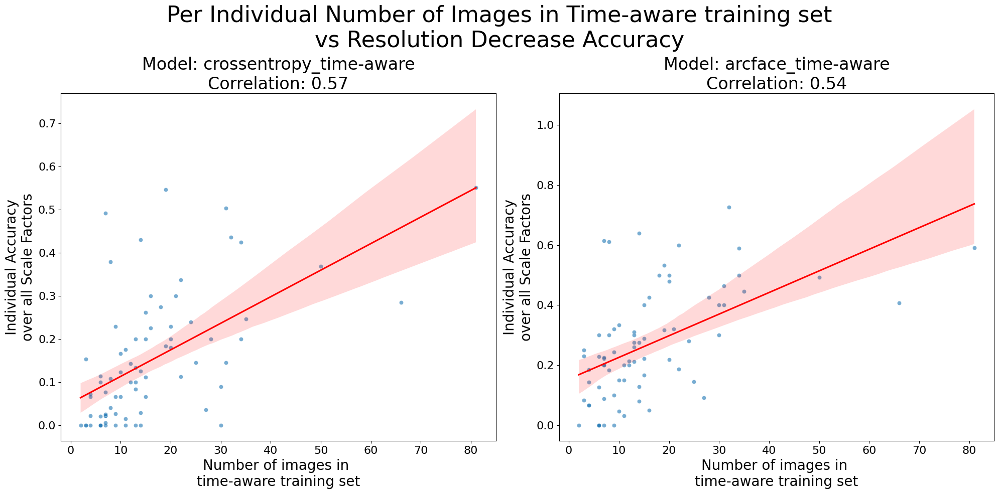

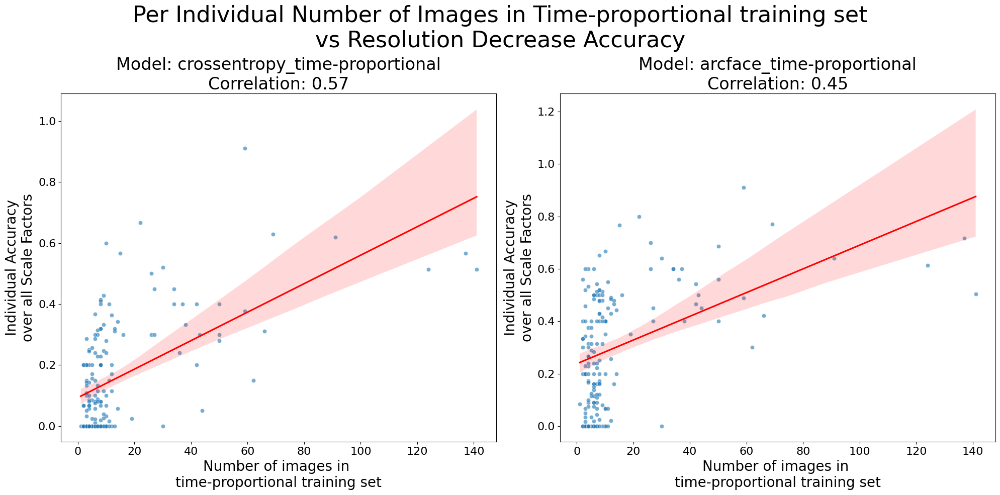

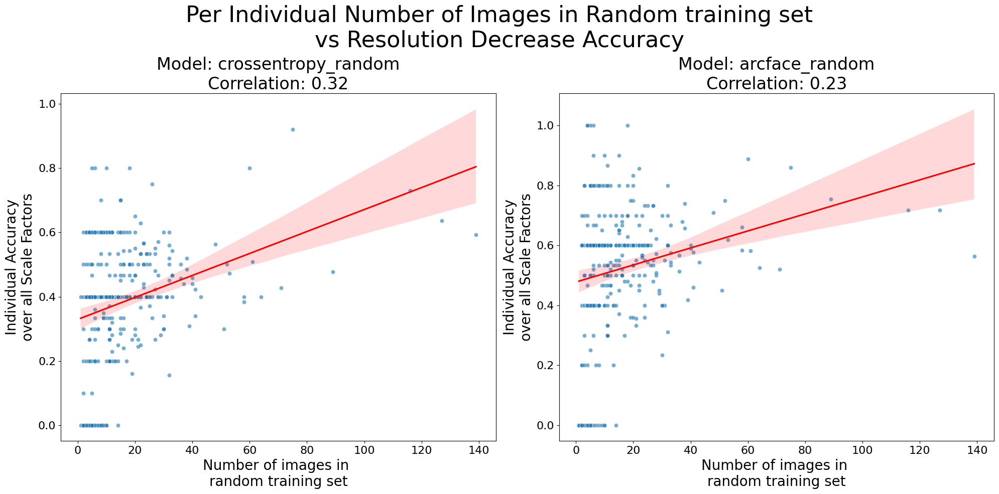

In [281]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

for split in ['time-aware', 'time-proportional', 'random']:
    # List of columns to visualize for this split
    columns_to_plot = [col for col in result.columns if col.endswith(f'{split}_breaking_sf')]

    # Set up the plot
    n_cols = 2
    n_rows = (len(columns_to_plot) + 1) // 2
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10))
    fig.suptitle(f'Per Individual Number of Images in {split.capitalize()} training set\nvs Resolution Decrease Accuracy', fontsize=32)
    axes = axes.flatten()  # Flatten the 2D array of axes for easier indexing

    # Create scatter plots for each column
    for i, column in enumerate(columns_to_plot):
        ax = axes[i]

        # Convert sigma-value column to numeric, coercing errors to NaN
        result[column] = pd.to_numeric(result[column], errors='coerce')
        
        # Create a temporary dataframe without NaN values
        temp_df = result[~result[column].isin([np.inf, -np.inf, np.nan]) & 
                 ~result[f'{split}_num_images'].isin([np.inf, -np.inf, np.nan])]
        
        # Create scatter plot
        sns.scatterplot(data=temp_df, x=f'{split}_num_images', y=column, ax=ax, alpha=0.6)
        
        # Add trend line
        sns.regplot(data=temp_df, x=f'{split}_num_images', y=column, ax=ax, scatter=False, color='red')
        
        # Calculate correlation coefficient
        corr = temp_df[f'{split}_num_images'].corr(temp_df[column])

        model_name = column.split('_')[0] + '_' + column.split('_')[1]
        
        # Set title and labels
        ax.set_title(f'Model: {model_name}\nCorrelation: {corr:.2f}', fontsize=24)
        ax.set_xlabel(f'Number of images in \n{split} training set', fontsize=20)
        ax.set_ylabel('Individual Accuracy\nover all Scale Factors', fontsize=20)

        # Increase tick font size
        ax.tick_params(axis='both', which='major', labelsize=16)

    # Remove any unused subplots
    for i in range(len(columns_to_plot), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

# Motion Blur

tensor(1.)


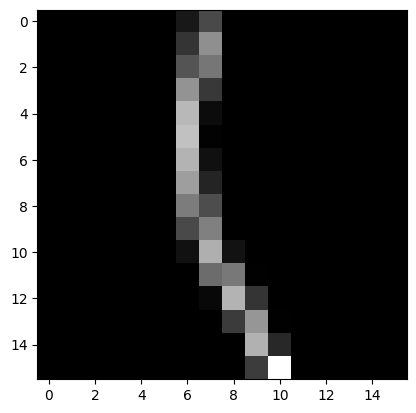

In [198]:
import torch
import torch.nn as nn
import torch.nn.functional as F

def random_motion(steps=16, initial_vector=None, alpha=0.2):
    if initial_vector is None:
        initial_vector = torch.randn(1, dtype=torch.cfloat)
    
    # Generate the random motion path
    motion = [torch.zeros_like(initial_vector)]
    for _ in range(steps):
        change = torch.randn(initial_vector.shape[0], dtype=torch.cfloat)
        initial_vector = initial_vector + change * alpha
        initial_vector /= initial_vector.abs().add(1e-8)
        motion.append(motion[-1] + initial_vector)
    
    motion = torch.stack(motion, -1)
    
    # Find bounding box
    real_min, _ = motion.real.min(dim=-1, keepdim=True)
    real_max, _ = motion.real.max(dim=-1, keepdim=True)
    imag_min, _ = motion.imag.min(dim=-1, keepdim=True)
    imag_max, _ = motion.imag.max(dim=-1, keepdim=True)

    # Scale motion to fit exactly in steps x steps
    real_scale = (steps - 1) / (real_max - real_min)
    imag_scale = (steps - 1) / (imag_max - imag_min)
    scale = torch.min(real_scale, imag_scale)
    
    real_shift = (steps - (real_max - real_min) * scale) / 2 - real_min * scale
    imag_shift = (steps - (imag_max - imag_min) * scale) / 2 - imag_min * scale
    
    scaled_motion = motion * scale + (real_shift + 1j * imag_shift)
    
    # Create kernel
    kernel = torch.zeros(initial_vector.shape[0], 1, steps, steps)
    
    # Fill kernel
    for s in range(steps + 1):
        v = scaled_motion[:, s]
        x = torch.clamp(v.real, 0, steps - 1)
        y = torch.clamp(v.imag, 0, steps - 1)
        
        ix = x.long()
        iy = y.long()
        
        vx = x - ix.float()
        vy = y - iy.float()
        
        for i in range(initial_vector.shape[0]):
            kernel[i, 0, iy[i], ix[i]] += (1-vx[i]) * (1-vy[i]) / steps
            if ix[i] + 1 < steps:
                kernel[i, 0, iy[i], ix[i]+1] += vx[i] * (1-vy[i]) / steps
            if iy[i] + 1 < steps:
                kernel[i, 0, iy[i]+1, ix[i]] += (1-vx[i]) * vy[i] / steps
            if ix[i] + 1 < steps and iy[i] + 1 < steps:
                kernel[i, 0, iy[i]+1, ix[i]+1] += vx[i] * vy[i] / steps

    # Normalize the kernel
    kernel /= kernel.sum(dim=(-1, -2), keepdim=True)
    
    return kernel

class RandomMotionBlur(nn.Module):
    """
    Apply random motion blur to input tensors.
    """
    def __init__(self, steps=17, alpha=0.2):
        """
        Initialize the RandomMotionBlur module.
        
        Args:
        - steps (int): Number of steps in the motion path
        - alpha (float): Controls the randomness of the motion path
        """
        super().__init__()
        self.steps = steps
        self.alpha = alpha
       
    def forward(self, x, return_kernel=False):
        """
        Apply random motion blur to the input tensor.
        
        Args:
        - x (torch.Tensor): Input tensor to be blurred
        - return_kernel (bool): If True, return both blurred tensor and kernel
        
        Returns:
        - y (torch.Tensor): Blurred tensor
        - m (torch.Tensor, optional): Blur kernel, if return_kernel is True
        """
        # Generate a random initial vector
        vector = torch.randn(x.shape[0], dtype=torch.cfloat) / 3
        vector.real /= 2
        
        # Create the motion blur kernel
        m = random_motion(self.steps, vector, alpha=self.alpha)
        
        # Pad the input tensor for convolution
        xpad = [m.shape[-1]//2+1] * 2 + [m.shape[-2]//2+1] * 2
        x = F.pad(x, xpad)
        
        # Pad the kernel to match input size
        mpad = [0, x.shape[-1]-m.shape[-1], 0, x.shape[-2]-m.shape[-2]]
        mp = F.pad(m, mpad)
        
        # Apply blur in the frequency domain
        fx = torch.fft.fft2(x)  # FFT of input
        fm = torch.fft.fft2(mp)  # FFT of kernel
        fy = fx * fm  # Multiplication in frequency domain
        y = torch.fft.ifft2(fy).real  # Inverse FFT to get blurred result
        
        # Crop the result to original size
        y = y[...,xpad[2]:-xpad[3], xpad[0]:-xpad[1]]
        
        return y if not return_kernel else (y, m)
    
steps = 16
direction = torch.randn(64, dtype=torch.cfloat)/3
kernel = random_motion(steps, direction, alpha=0.2)
print(kernel[0, 0].sum())
plt.imshow(kernel[0,0], cmap='gray')

In [205]:
import numpy as np

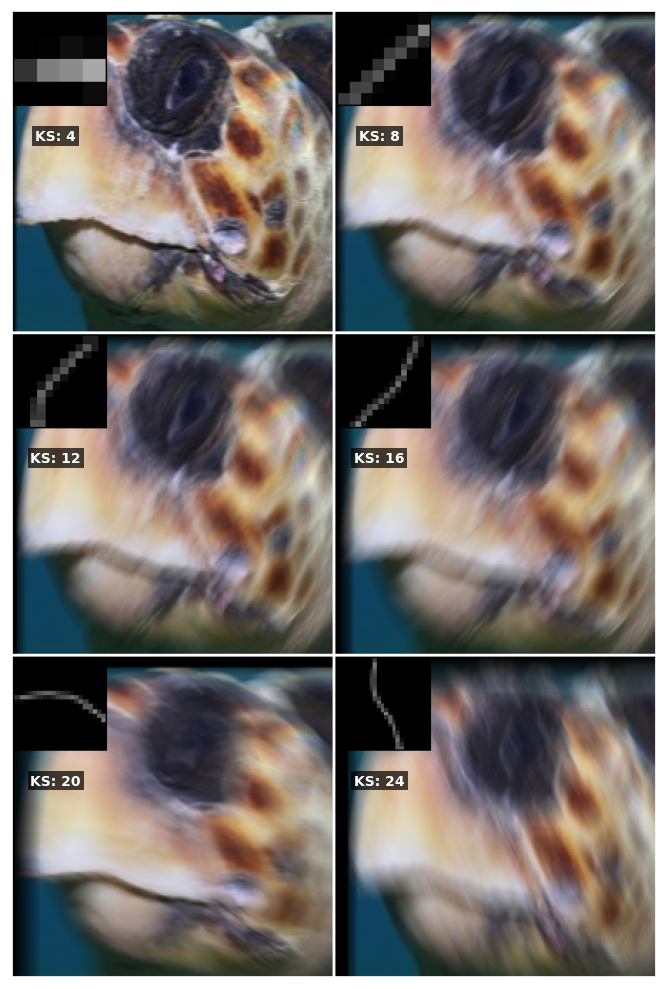

In [213]:
def denormalize(tensor, mean, std):
    """
    Denormalize a tensor given the mean and standard deviation used for normalization.
    
    Args:
    - tensor (torch.Tensor): Input tensor to denormalize
    - mean (tuple): Mean values used for normalization
    - std (tuple): Standard deviation values used for normalization
    
    Returns:
    - torch.Tensor: Denormalized tensor
    """
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return tensor * std + mean

step_sizes = [4, 8, 12, 16, 20, 24]
# Get the first batch from the test loader
dataiter = iter(test_loader)
images, _ = next(dataiter)
# Select the first image from the batch
image = images[36].unsqueeze(0)  # Add batch dimension [1, C, H, W]

# Denormalization parameters
mean = (0.3717, 0.4016, 0.3666)
std = (0.1553, 0.1433, 0.1397)

# Denormalize the image
image = denormalize(image, mean, std)

blurred_images = []
kernels = []

for step_size in step_sizes:
    blur = RandomMotionBlur(steps=step_size)
    blurred, kernel = blur(image, return_kernel=True)
    kernel = F.interpolate(kernel, scale_factor=64 / step_size, mode="nearest")

    kernel /= 64 / step_size
    
    blurred_images.append(blurred.squeeze(0))
    kernels.append(kernel.squeeze(0))

# Create a grid of images
grid = make_grid(torch.stack(blurred_images), nrow=len(step_sizes) // 3, normalize=False, pad_value=1)

# Convert grid to numpy for easier manipulation
grid_np = grid.permute(1, 2, 0).numpy()

# Clip values to [0, 1] range
grid_np = np.clip(grid_np, 0, 1)

# Plot the grid
fig, ax = plt.subplots(figsize=(20, 10))
ax.imshow(grid_np)
ax.axis('off')

# Function to add bordered kernel to the image
def add_bordered_kernel(img, kernel, pos, border_color=[0, 0, 0], scale=33):
    h, w = kernel.shape[1:]
    y, x = pos
    
    # Add border
    img[y-1:y+h+1, x-1:x+w+1] = border_color
    
    # Add kernel
    img[y:y+h, x:x+w] = np.clip(kernel.permute(1, 2, 0).numpy() * scale, 0, 1)

    return img

# Add kernels and labels to the grid
nrows = 3
ncols = len(step_sizes) // 3
for i, (step_size, kernel) in enumerate(zip(step_sizes, kernels)):
    row = i // ncols
    col = i % ncols
    
    # Calculate position for kernel
    image_width = grid_np.shape[1] // ncols
    image_height = grid_np.shape[0] // nrows
    kernel_size = 64
    x = col * image_width + 3
    y = row * image_height + 3
    
    # Add kernel to grid
    grid_np = add_bordered_kernel(grid_np, kernel, (y, x))
    
    # Add text label
    label_x = (col * image_width + kernel_size / 2) / grid_np.shape[1]
    label_y = 1 - (row * image_height + kernel_size + 20) / grid_np.shape[0]
    ax.text(label_x, label_y, f'KS: {step_size}', ha='center', va='top', transform=ax.transAxes,
            fontweight='bold', fontsize=10, color='white',
            bbox=dict(facecolor='black', edgecolor='none', alpha=0.7, pad=2))

# Display the final image
ax.imshow(grid_np)
plt.tight_layout()
plt.show()

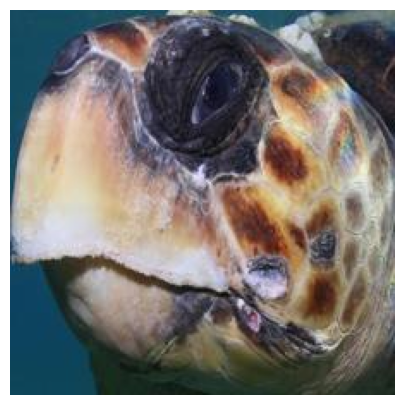

In [140]:
# Plot image
plt.figure(figsize=(5, 5))
plt.imshow(image[0].permute(1, 2, 0))
plt.axis('off')
plt.show()

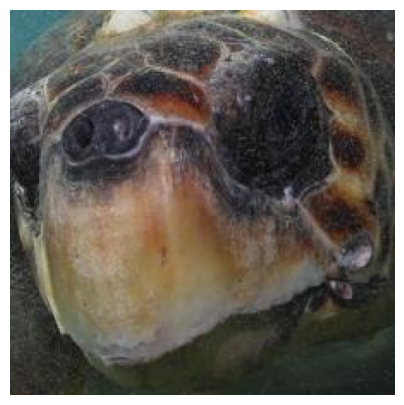

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


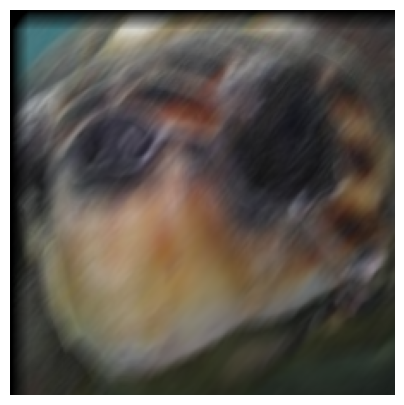

In [251]:
# Get an image and plot it clean and blurred
# Get the first batch from the test loader
dataiter = iter(test_loader)
images, _ = next(dataiter)
# Select the first image from the batch
image = images[38].unsqueeze(0)  # Add batch dimension [1, C, H, W]

# Denormalization parameters
mean = (0.3717, 0.4016, 0.3666)
std = (0.1553, 0.1433, 0.1397)

# Denormalize the image
image = denormalize(image, mean, std)

# Create a RandomMotionBlur module
blur = RandomMotionBlur(steps=12, alpha=0.2)

# Apply the blur
blurred, kernel = blur(image, return_kernel=True)

# Plot the original and blurred images on two separate plots
plt.figure(figsize=(5, 5))
plt.imshow(image[0].permute(1, 2, 0))
plt.axis('off')
plt.show()

plt.figure(figsize=(5, 5))
plt.imshow(blurred[0].permute(1, 2, 0))
plt.axis('off')
plt.show()

In [310]:
mb_results = pd.DataFrame(columns=['split', 'model', 'aug', 'mdaug', 'step_size', 'overall_accuracy', 'avg_individual_accuracy'])

for pred_column in [col for col in df.columns if 'mb' in col]:
    model = pred_column.split('_')[0]
    aug = pred_column.split('_')[1]
    mdaug = pred_column.split('_')[0] + ' - ' + pred_column.split('_')[1]
    split = pred_column.split('_')[2]
    ss = pred_column.split('ss=')[1].split(')')[0]

    acc = overall_accuracy(df, split, pred_column)
    avg_acc = avg_individual_accuracy(df, split, pred_column)

    new_row = pd.DataFrame({'split': [split], 'model': [model], 'aug': [aug], 'mdaug': [mdaug], 'step_size': [ss], 'overall_accuracy': [acc], 'avg_individual_accuracy': [avg_acc]})
    mb_results = pd.concat([mb_results, new_row])

In [320]:
df_melted = mb_results
#mb_results.melt(id_vars=['split', 'model', 'step_size'], value_vars=['avg_individual_accuracy', 'overall_accuracy'], var_name='metric', value_name='accuracy')

chart = alt.Chart(df_melted).mark_line().encode(
    x=alt.X('step_size:Q', title='Step Size'),
    y=alt.Y('overall_accuracy:Q', title='Accuracy'),
    color=alt.Color('model:N', title='Model'),
    column=alt.Column('split:N', title='Split', sort=['time-aware', 'time-proportional', 'random']),
    strokeDash=alt.StrokeDash('aug:N', 
        scale=alt.Scale(
            domain=['base', 'distorted'],
            range=[[0], [4,2]]
        ),
        title=['Training', 'Augmentation']
    )
).properties(
    width=300,
    height=300,
    title=alt.TitleParams(text='Model Performance with Motion Blur', fontSize=30, anchor='middle', offset=20)
).configure_axis(
    labelFontSize=18,
    titleFontSize=24
).configure_header(
    labelFontSize=18,
    titleFontSize=24
).configure_legend(
    labelFontSize=18,
    titleFontSize=24
)

chart

alt.Chart(...)

In [322]:
df_melted = mb_results.melt(id_vars=['split', 'model', 'mdaug', 'aug', 'step_size'], value_vars=['avg_individual_accuracy', 'overall_accuracy'], var_name='metric', value_name='accuracy')

chart = alt.Chart(df_melted).mark_line().encode(
    x=alt.X('step_size:Q', title='Step Size'),
    y=alt.Y('accuracy:Q', title='Accuracy'),
    color=alt.Color('mdaug:N', title='Model - Aug'),
    column=alt.Column('split:N', title='Split', sort=['time-aware', 'time-proportional', 'random']),
    strokeDash=alt.StrokeDash('metric:N', 
        scale=alt.Scale(
            domain=['overall_accuracy', 'avg_individual_accuracy'],
            range=[[0], [4,2]]
        ),
        title=['Accuracy', 'Metric']
    )
).properties(
    width=300,
    height=300,
    title=alt.TitleParams(text='Model Performance with Motion Blur', fontSize=30, anchor='middle', offset=20)
).configure_axis(
    labelFontSize=18,
    titleFontSize=24
).configure_header(
    labelFontSize=18,
    titleFontSize=24
).configure_legend(
    labelFontSize=18,
    titleFontSize=24,
    labelLimit=0
)

chart

alt.Chart(...)

In [282]:
# First, let's get all the prediction columns
pred_cols = [col for col in df.columns if 'mb' in col and 'base' in col]

# Create a new dataframe to store the results
result = pd.DataFrame()

# Copy the individual and split columns
result['identity'] = df['identity']
result['time-aware'] = df['time-aware']
result['time-proportional'] = df['time-proportional']
result['random'] = df['random']

# Function to find the sigma at which prediction becomes incorrect
def find_breaking_ss(row, base_col):
    step_sizes = [4, 8, 12, 16, 20, 24]
    correct = 0
    for ss in step_sizes:
        col = f"{base_col}_mb(ss={ss})"
        if row[col] == row['identity']:
            correct += 1
    return correct / len(step_sizes)

# Process each model and split combination
models = ['crossentropy', 'arcface']
splits = ['time-aware', 'time-proportional', 'random']

for model in models:
    for split in splits:
        base_col = f"{model}_base_{split}"
        result[f"{model}_{split}_breaking_mb"] = df.apply(lambda x: find_breaking_ss(x, base_col) if x[f"{split}"] == 'test' else np.nan, axis=1)

indiv_result = result[['identity']].drop_duplicates().copy()

for col in [col for col in result.columns if 'breaking_mb' in col]:
    # Find the average over the column for the individuals and save to indiv_result
    indiv_result[col] = None

    for idx, row in indiv_result.iterrows():
        indiv_result.loc[idx, col] = result[result['identity'] == row['identity']][col].mean()

result = indiv_result

In [283]:
time_aware_split_images_per_individual = df[df['time-aware'] == 'train']['identity'].value_counts()
time_proportional_split_images_per_individual = df[df['time-proportional'] == 'train']['identity'].value_counts()
random_split_images_per_individual = df[df['random'] == 'train']['identity'].value_counts()

time_aware_orientations_per_individual = df[df['time-aware'] == 'train'].groupby('identity')['orientation'].nunique()
time_proportional_orientations_per_individual = df[df['time-proportional'] == 'train'].groupby('identity')['orientation'].nunique()
random_orientations_per_individual = df[df['random'] == 'train'].groupby('identity')['orientation'].nunique()

time_aware_split_orientations_per_individual = df[df['time-aware'] == 'train'].groupby('identity')['orientation'].nunique()
time_proportional_split_orientations_per_individual = df[df['time-proportional'] == 'train'].groupby('identity')['orientation'].nunique()
random_split_orientations_per_individual = df[df['random'] == 'train'].groupby('identity')['orientation'].nunique()

for split in splits:
    # Merge the number of images per individual for this split into the result dataframe
    result[f'{split}_num_images'] = result['identity'].map(globals()[f'{split.replace("-", "_")}_split_images_per_individual'])
    result[f'{split}_num_orientations'] = result['identity'].map(globals()[f'{split.replace("-", "_")}_split_orientations_per_individual'])

    train_df = df[df[f'{split}'] == 'train']
    
    # Count the number of images for each individual and orientation in the training set
    train_counts = train_df.groupby(['identity', 'orientation']).size().reset_index(name='count')
    
    # Create a multi-index series for easy mapping
    train_counts_series = train_counts.set_index(['identity', 'orientation'])['count']
    
    # Function to get the count for an identity and orientation, returning 0 if not found
    def get_count(row):
        try:
            return train_counts_series.loc[(row['identity'], row['orientation'])]
        except KeyError:
            return 0
    
    # Apply the function to create the new column
    df[f'{split}_num_images_same_orientation'] = df.apply(get_count, axis=1)

    # Now, transfer this new column to the result dataframe
    result[f'{split}_num_images_same_orientation'] = result['identity'].map(
        df.groupby('identity')[f'{split}_num_images_same_orientation'].first()
    )

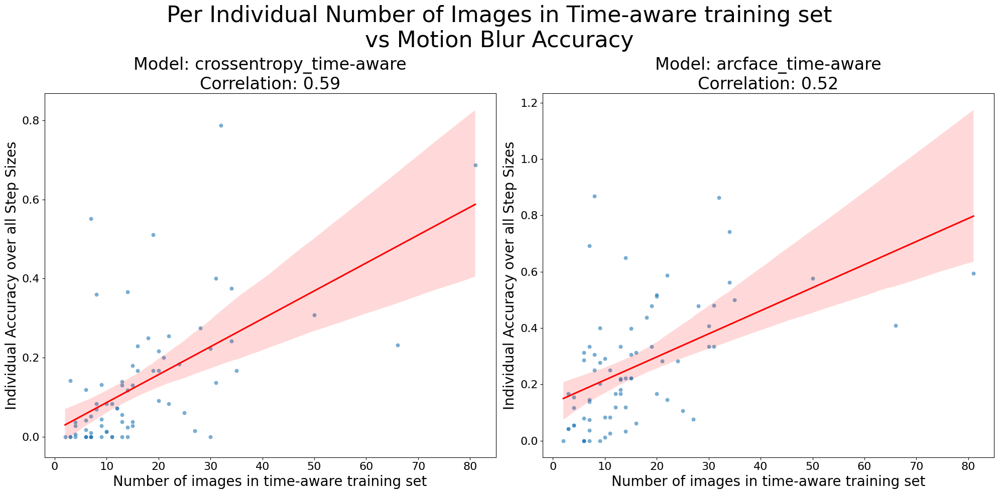

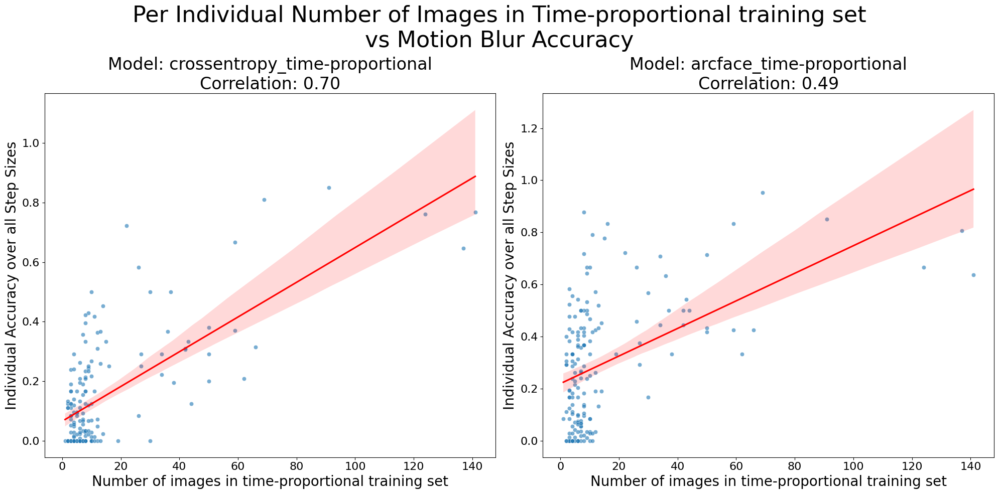

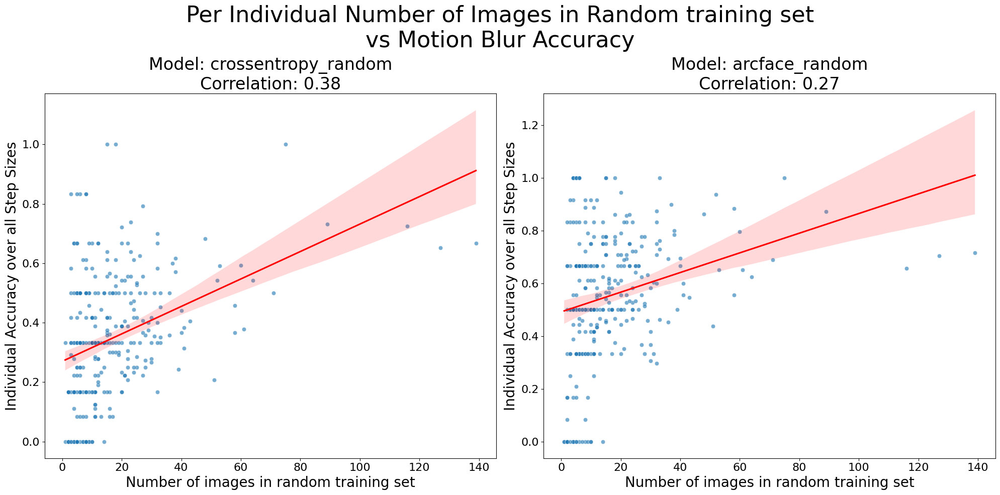

In [285]:
for split in ['time-aware', 'time-proportional', 'random']:
    # Merge the number of images per individual for this split into the result dataframe
    result[f'{split}_num_images'] = result['identity'].map(globals()[f'{split.replace("-", "_")}_split_images_per_individual'])

    # List of columns to visualize for this split
    columns_to_plot = [col for col in result.columns if col.endswith(f'{split}_breaking_mb')]

    # Set up the plot
    n_cols = 2
    n_rows = (len(columns_to_plot) + 1) // 2
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10))
    fig.suptitle(f'Per Individual Number of Images in {split.capitalize()} training set\nvs Motion Blur Accuracy', fontsize=32)
    axes = axes.flatten()  # Flatten the 2D array of axes for easier indexing

    # Create scatter plots for each column
    for i, column in enumerate(columns_to_plot):
        ax = axes[i]

        # Convert sigma-value column to numeric, coercing errors to NaN
        result[column] = pd.to_numeric(result[column], errors='coerce')
        
        # Create a temporary dataframe without NaN values
        temp_df = result[~result[column].isin([np.inf, -np.inf, np.nan]) & 
                 ~result[f'{split}_num_images'].isin([np.inf, -np.inf, np.nan])]
        
        # Create scatter plot
        sns.scatterplot(data=temp_df, x=f'{split}_num_images', y=column, ax=ax, alpha=0.6)
        
        # Add trend line
        sns.regplot(data=temp_df, x=f'{split}_num_images', y=column, ax=ax, scatter=False, color='red')
        
        # Calculate correlation coefficient
        corr = temp_df[f'{split}_num_images'].corr(temp_df[column])

        model_name = column.split('_')[0] + '_' + column.split('_')[1]
        
        # Set title and labels
        ax.set_title(f'Model: {model_name}\nCorrelation: {corr:.2f}', fontsize=24)
        ax.set_xlabel(f'Number of images in {split} training set', fontsize=20)
        ax.set_ylabel('Individual Accuracy over all Step Sizes', fontsize=20)

        # Increase tick font size
        ax.tick_params(axis='both', which='major', labelsize=16)

    # Remove any unused subplots
    for i in range(len(columns_to_plot), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

# Gaussian Blur

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


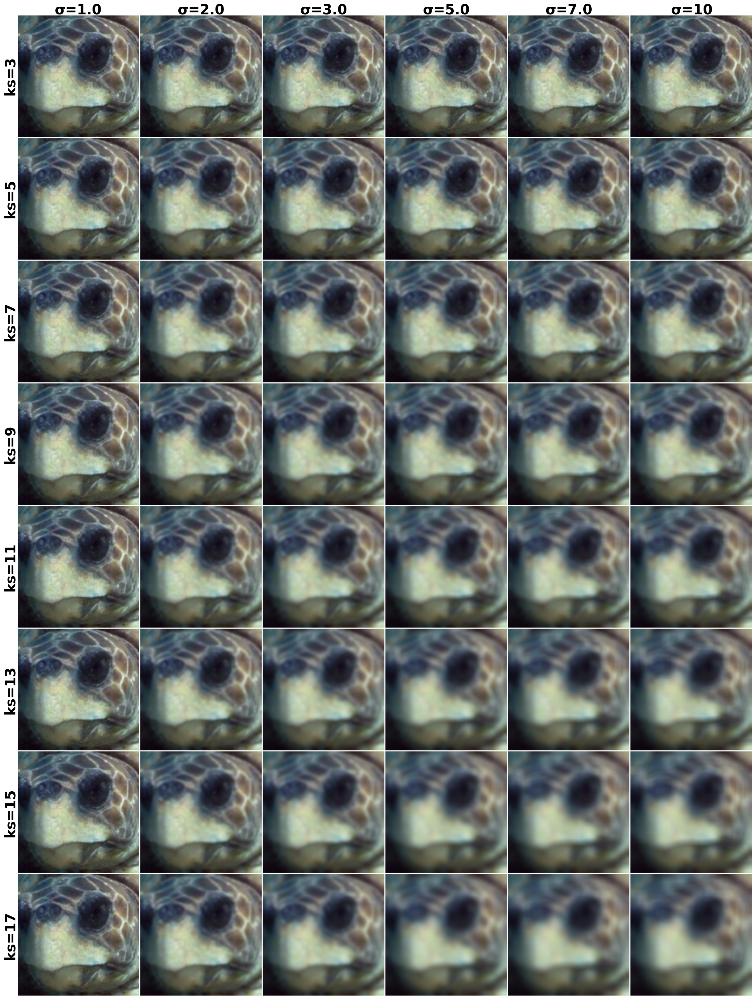

In [295]:
import torchvision.transforms.functional as TF

def gaussian_blur(images, kernel_size=5, sigma=2.0):
    return TF.gaussian_blur(images, kernel_size, sigma) if sigma > 0 else images

import torch
import torchvision.transforms.functional as TF
import matplotlib.pyplot as plt
from torchvision.utils import make_grid

# Get the first batch from the test loader
dataiter = iter(test_loader)
images, _ = next(dataiter)

# Select the first image from the batch
image = images[6].unsqueeze(0)  # Add batch dimension [1, C, H, W]

kernel_sizes = [3, 5, 7, 9, 11, 13, 15, 17]
sigma_values = [1.0, 2.0, 3.0, 5.0, 7.0, 10]

# Create a grid of blurred images
blurred_images = []
for kernel_size in kernel_sizes:
    for sigma in sigma_values:
        if sigma == 0:
            blurred = image
        else:
            blurred = gaussian_blur(image, kernel_size, sigma)
        blurred_images.append(blurred)

# Create a grid of images
grid = make_grid(torch.cat(blurred_images, 0), nrow=len(sigma_values), normalize=True, pad_value=2)

# Plot the grid
plt.figure(figsize=(30, 30))
plt.imshow(grid.permute(1, 2, 0))
plt.axis('off')

# Add labels
for i, kernel_size in enumerate(kernel_sizes):
    plt.text(-25, i * grid.shape[1] / len(kernel_sizes) + grid.shape[1] / (2 * len(kernel_sizes)), 
             f'ks={kernel_size}', verticalalignment='center', rotation=90, fontsize=30, fontdict={'weight': 'bold'})

for i, sigma in enumerate(sigma_values):
    plt.text(i * grid.shape[2] / len(sigma_values) + grid.shape[2] / (2 * len(sigma_values)), -0.5, 
             f'σ={sigma}', horizontalalignment='center', fontsize=30, fontdict={'weight': 'bold'})

plt.tight_layout()
plt.show()

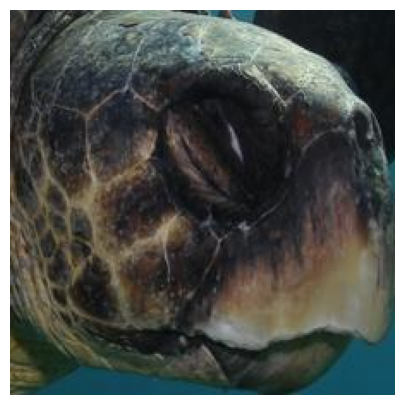

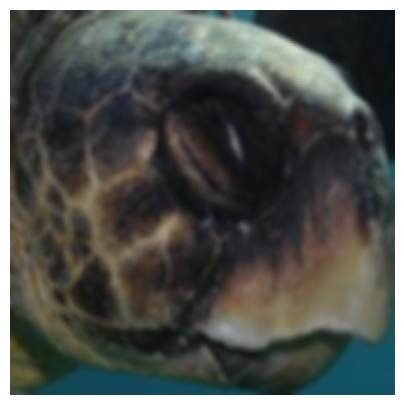

In [287]:
# import transformations
from torchvision import transforms

# Get an image and plot it clean and blurred
# Get the first batch from the test loader
dataiter = iter(test_loader)
images, _ = next(dataiter)
# Select the first image from the batch
image = images[23].unsqueeze(0)  # Add batch dimension [1, C, H, W]

# Denormalization parameters
mean = (0.3717, 0.4016, 0.3666)
std = (0.1553, 0.1433, 0.1397)

# Denormalize the image
image = denormalize(image, mean, std)

# Blur image
blurred = gaussian_blur(image, kernel_size=5, sigma=2.0)

# Plot the original and blurred images on two separate plots
plt.figure(figsize=(5, 5))
plt.imshow(image[0].permute(1, 2, 0))
plt.axis('off')
plt.show()

plt.figure(figsize=(5, 5))
plt.imshow(blurred[0].permute(1, 2, 0))
plt.axis('off')
plt.show()

In [149]:
from models import load_model_and_data

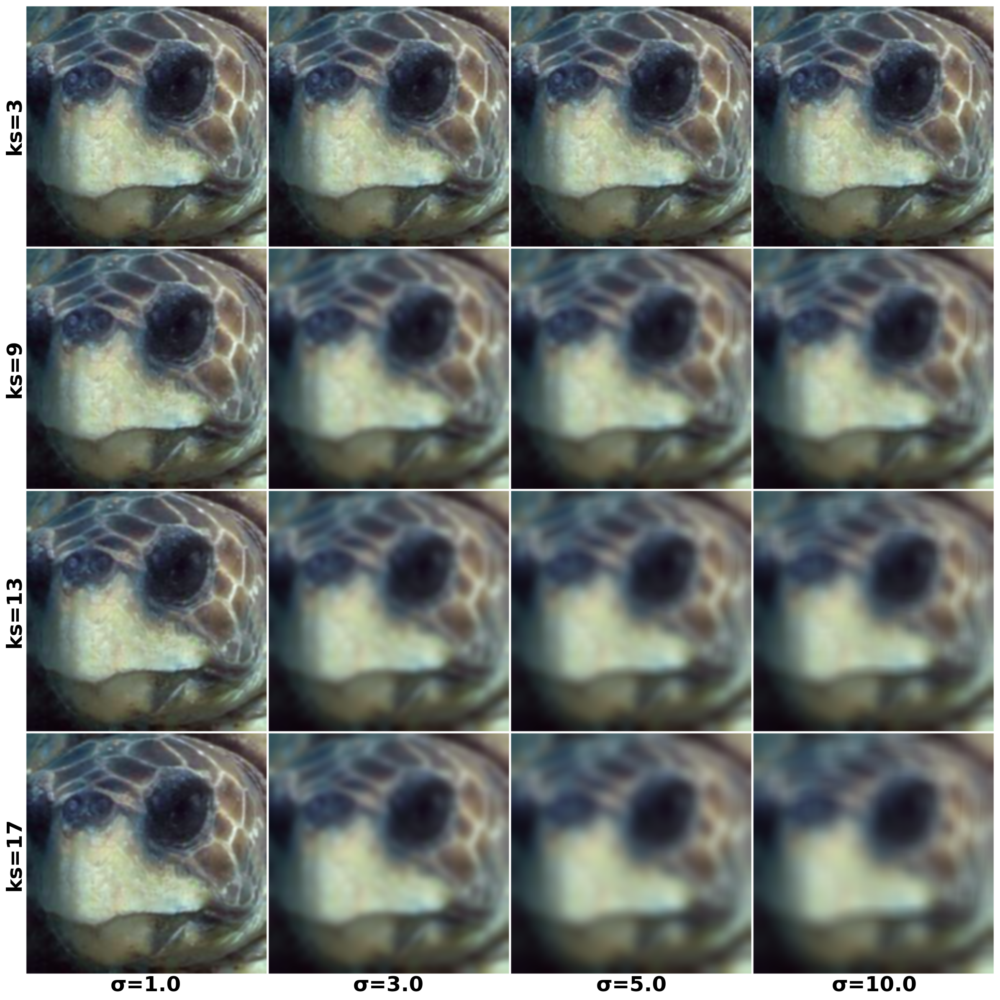

In [287]:
def gaussian_blur(images, kernel_size=5, sigma=2.0):
    return TF.gaussian_blur(images, kernel_size, sigma) if sigma > 0 else images

result = load_model_and_data('arcface_base_time-aware.pth', 'arcface', 'time-aware', label_map)
model = result['model']
test_loader = result['test_loader']
clean_train_loader = result['clean_train_loader']

# Assuming test_loader is defined elsewhere
dataiter = iter(test_loader)
images, _ = next(dataiter)
image = images[6].unsqueeze(0)  # Add batch dimension [1, C, H, W]

kernel_sizes = [3, 9, 13, 17]
sigma_values = [1.0, 3.0, 5.0, 10.0]

# Create a grid of blurred images
blurred_images = []
for kernel_size in kernel_sizes:
    for sigma in sigma_values:
        blurred = gaussian_blur(image, kernel_size, sigma)
        blurred_images.append(blurred)

# Create a grid of images
grid = make_grid(torch.cat(blurred_images, 0), nrow=len(sigma_values), normalize=True, pad_value=1)

# Plot the grid
fig, ax = plt.subplots(figsize=(24, 24))
ax.imshow(grid.permute(1, 2, 0))
ax.axis('off')

# Add labels for kernel sizes (y-axis)
for i, kernel_size in enumerate(reversed(kernel_sizes)):
    ax.text(0, (i + 0.5) / len(kernel_sizes), f'ks={kernel_size}',
            transform=ax.transAxes, verticalalignment='center',
            horizontalalignment='right', fontsize=36, fontweight='bold', rotation=90)

# Add labels for sigma values (x-axis)
for i, sigma in enumerate(sigma_values):
    ax.text((i + 0.5) / len(sigma_values), 0, f'σ={sigma}',
            transform=ax.transAxes, horizontalalignment='center',
            verticalalignment='top', fontsize=36, fontweight='bold')

plt.tight_layout()
plt.show()

In [297]:
blur_results = pd.DataFrame(columns=['split', 'model', 'aug', 'kernel_size', 'sigma', 'overall_accuracy', 'avg_individual_accuracy'])

for pred_column in [col for col in df.columns if 'gb' in col]:
    model = pred_column.split('_')[0]
    aug = pred_column.split('_')[1]
    split = pred_column.split('_')[2]
    ks = int(pred_column.split('ks=')[1].split(',')[0])
    sigma = float(pred_column.split('sigma=')[1].split(')')[0])

    acc = overall_accuracy(df, split, pred_column)
    avg_acc = avg_individual_accuracy(df, split, pred_column)

    new_row = pd.DataFrame({'split': [split], 'model': [model], 'aug': [aug], 'kernel_size': [ks], 'sigma': [sigma], 'overall_accuracy': [acc], 'avg_individual_accuracy': [avg_acc]})
    blur_results = pd.concat([blur_results, new_row])

In [339]:
blur_results['mdaug'] = blur_results['model'] + ' - ' + blur_results['aug']

In [333]:
df_melted = blur_results # .melt(id_vars=['split', 'model', 'kernel_size', 'sigma'], value_vars=['avg_individual_accuracy', 'overall_accuracy'], var_name='metric', value_name='accuracy')

# Get sorted unique sigma values
sigma_values = sorted(df_melted['sigma'].unique())

# Create a selection for sigma with a default value
sigma_selector = alt.selection_point(
    name='sigma_selector',
    fields=['sigma'],
    bind=alt.binding_select(options=sigma_values, name='Sigma'),
    value=sigma_values[-1]
)

alt.Chart(df_melted).mark_line().encode(
    # make x-axis inverted
    x=alt.X('kernel_size:O', title='Kernel Size'),
    y=alt.Y('overall_accuracy:Q', title='Accuracy'),
    color=alt.Color('model:N', title='Model'),
    column=alt.Column('split:N', title='Split', sort=['time-aware', 'time-proportional', 'random']),
    strokeDash=alt.StrokeDash('aug:N', 
        scale=alt.Scale(
            domain=['base', 'distorted'],
            range=[[0], [4,2]]
        ),
        title=['Training', 'Augmentation']
    )
).add_params(
    sigma_selector
).transform_filter(
    sigma_selector
).properties(
    width=300,
    height=300,
    title=alt.TitleParams(text=f'Model Performance with Gaussian Blur', fontSize=30, anchor='middle', offset=20)
).configure_axis(
    labelFontSize=18,
    titleFontSize=24
).configure_header(
    labelFontSize=18,
    titleFontSize=24
).configure_legend(
    labelFontSize=18,
    titleFontSize=24
)

alt.Chart(...)

In [341]:
df_melted = blur_results.melt(id_vars=['split', 'model', 'aug', 'mdaug', 'kernel_size', 'sigma'], value_vars=['avg_individual_accuracy', 'overall_accuracy'], var_name='metric', value_name='accuracy')

# Get sorted unique sigma values
sigma_values = sorted(df_melted['sigma'].unique())

# Create a selection for sigma with a default value
sigma_selector = alt.selection_point(
    name='sigma_selector',
    fields=['sigma'],
    bind=alt.binding_select(options=sigma_values, name='Sigma'),
    value=sigma_values[-1]
)

alt.Chart(df_melted).mark_line().encode(
    # make x-axis inverted
    x=alt.X('kernel_size:O', title='Kernel Size'),
    y=alt.Y('accuracy:Q', title='Accuracy'),
    color=alt.Color('mdaug:N', title='Model - Aug'),
    column=alt.Column('split:N', title='Split', sort=['time-aware', 'time-proportional', 'random']),
    strokeDash=alt.StrokeDash('metric:N', 
        scale=alt.Scale(
            domain=['overall_accuracy', 'avg_individual_accuracy'],
            range=[[0], [4,2]]
        ),
        title=['Accuracy', 'Metric']
    )
).add_params(
    sigma_selector
).transform_filter(
    sigma_selector
).properties(
    width=300,
    height=300
).configure_axis(
    labelFontSize=18,
    titleFontSize=24
).configure_header(
    labelFontSize=18,
    titleFontSize=24
).configure_legend(
    labelFontSize=18,
    titleFontSize=24,
    labelLimit=0
)

alt.Chart(...)

In [299]:
# First, let's get all the prediction columns
pred_cols = [col for col in df.columns if 'gb' in col and 'base' in col]

# Create a new dataframe to store the results
result = pd.DataFrame()

# Copy the individual and split columns
result['identity'] = df['identity']
result['time-aware'] = df['time-aware']
result['time-proportional'] = df['time-proportional']
result['random'] = df['random']

# Function to find the sigma at which prediction becomes incorrect
def find_breaking_ks(row, base_col):
    kernel_sizes = [3, 5, 7, 9, 11, 13, 15, 17]
    correct = 0
    for ks in kernel_sizes:
        col = base_col.replace('(', f'(ks={ks}, ')
        if row[col] == row['identity']:
            correct += 1
    return correct / len(kernel_sizes)

# Process each model and split combination
models = ['crossentropy', 'arcface']
splits = ['time-aware', 'time-proportional', 'random']

for model in models:
    for split in splits:
        base_col = f"{model}_base_{split}_gb(sigma=10.0)"
        result[f"{base_col}"] = df.apply(lambda row: find_breaking_ks(row, base_col) if row[f"{split}"] == 'test' else np.nan, axis=1)

indiv_result = result[['identity']].drop_duplicates().copy()

for col in [col for col in result.columns if 'gb' in col]:
    # Find the average over the column for the individuals and save to indiv_result
    indiv_result[col] = None

    for idx, row in indiv_result.iterrows():
        indiv_result.loc[idx, col] = result[result['identity'] == row['identity']][col].mean()

result = indiv_result

In [300]:
time_aware_split_images_per_individual = df[df['time-aware'] == 'train']['identity'].value_counts()
time_proportional_split_images_per_individual = df[df['time-proportional'] == 'train']['identity'].value_counts()
random_split_images_per_individual = df[df['random'] == 'train']['identity'].value_counts()

time_aware_orientations_per_individual = df[df['time-aware'] == 'train'].groupby('identity')['orientation'].nunique()
time_proportional_orientations_per_individual = df[df['time-proportional'] == 'train'].groupby('identity')['orientation'].nunique()
random_orientations_per_individual = df[df['random'] == 'train'].groupby('identity')['orientation'].nunique()

time_aware_split_orientations_per_individual = df[df['time-aware'] == 'train'].groupby('identity')['orientation'].nunique()
time_proportional_split_orientations_per_individual = df[df['time-proportional'] == 'train'].groupby('identity')['orientation'].nunique()
random_split_orientations_per_individual = df[df['random'] == 'train'].groupby('identity')['orientation'].nunique()

for split in splits:
    # Merge the number of images per individual for this split into the result dataframe
    result[f'{split}_num_images'] = result['identity'].map(globals()[f'{split.replace("-", "_")}_split_images_per_individual'])
    result[f'{split}_num_orientations'] = result['identity'].map(globals()[f'{split.replace("-", "_")}_split_orientations_per_individual'])
    # Create a temporary dataframe with only the training images for this split
    train_df = df[df[f'{split}'] == 'train']
    
    # Count the number of images for each individual and orientation in the training set
    train_counts = train_df.groupby(['identity', 'orientation']).size().reset_index(name='count')
    
    # Create a multi-index series for easy mapping
    train_counts_series = train_counts.set_index(['identity', 'orientation'])['count']
    
    # Function to get the count for an identity and orientation, returning 0 if not found
    def get_count(row):
        try:
            return train_counts_series.loc[(row['identity'], row['orientation'])]
        except KeyError:
            return 0
    
    # Apply the function to create the new column
    df[f'{split}_num_images_same_orientation'] = df.apply(get_count, axis=1)

    # Now, transfer this new column to the result dataframe
    result[f'{split}_num_images_same_orientation'] = result['identity'].map(
        df.groupby('identity')[f'{split}_num_images_same_orientation'].first()
    )

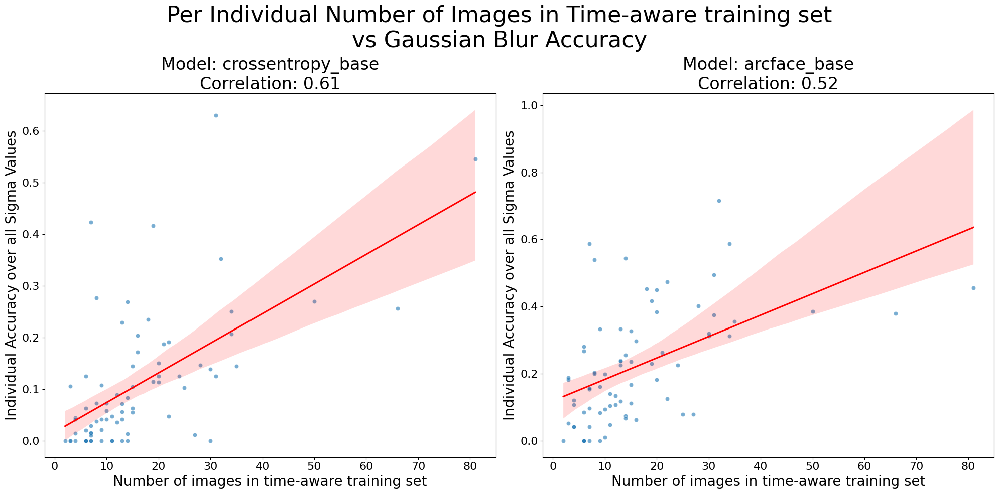

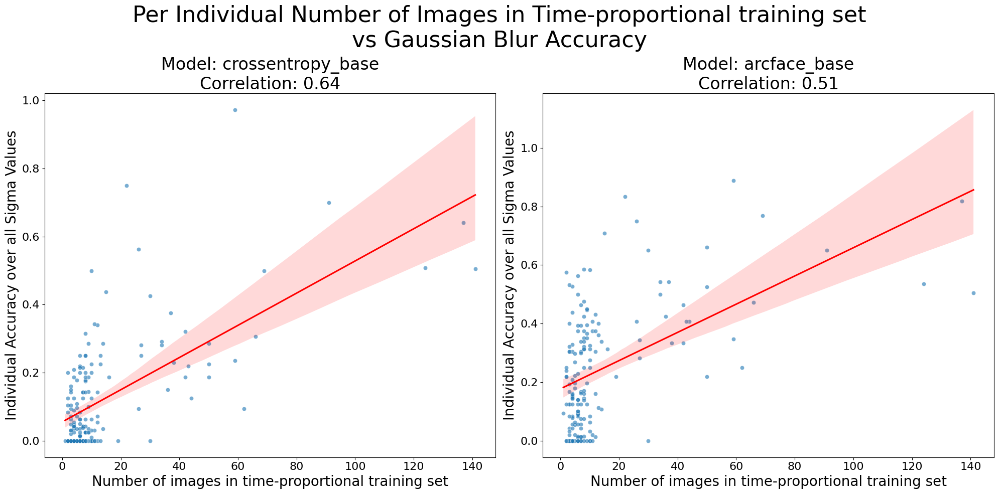

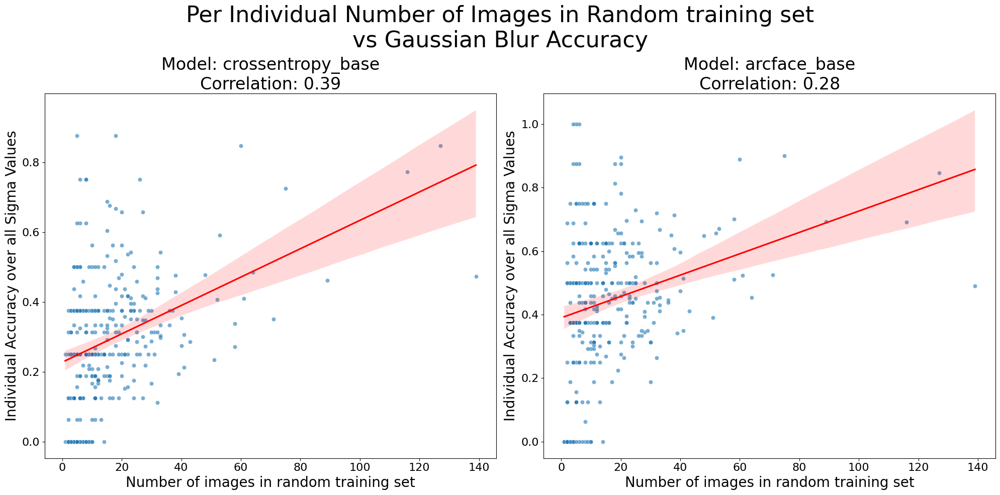

In [343]:
for split in ['time-aware', 'time-proportional', 'random']:
    # List of columns to visualize for this split
    columns_to_plot = [col for col in result.columns if col.endswith(f'{split}_gb(sigma=10.0)')]

    # Set up the plot
    n_cols = 2
    n_rows = (len(columns_to_plot) + 1) // 2
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 10))
    fig.suptitle(f'Per Individual Number of Images in {split.capitalize()} training set\nvs Gaussian Blur Accuracy', fontsize=32)
    axes = axes.flatten()  # Flatten the 2D array of axes for easier indexing

    # Create scatter plots for each column
    for i, column in enumerate(columns_to_plot):
        ax = axes[i]

        # Convert sigma-value column to numeric, coercing errors to NaN
        result[column] = pd.to_numeric(result[column], errors='coerce')
        
        # Create a temporary dataframe without NaN values
        temp_df = result[~result[column].isin([np.inf, -np.inf, np.nan]) & 
                 ~result[f'{split}_num_images'].isin([np.inf, -np.inf, np.nan])]
        
        # Create scatter plot
        sns.scatterplot(data=temp_df, x=f'{split}_num_images', y=column, ax=ax, alpha=0.6)
        
        # Add trend line
        sns.regplot(data=temp_df, x=f'{split}_num_images', y=column, ax=ax, scatter=False, color='red')
        
        # Calculate correlation coefficient
        corr = temp_df[f'{split}_num_images'].corr(temp_df[column])

        model_name = column.split('_')[0] + '_' + column.split('_')[1]
        
        # Set title and labels
        ax.set_title(f'Model: {model_name}\nCorrelation: {corr:.2f}', fontsize=24)
        ax.set_xlabel(f'Number of images in {split} training set', fontsize=20)
        ax.set_ylabel('Individual Accuracy over all Sigma Values', fontsize=20)

        # Increase tick font size
        ax.tick_params(axis='both', which='major', labelsize=16)

    # Remove any unused subplots
    for i in range(len(columns_to_plot), len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()